# Test 2; with gravity data noise

import packages

In [1]:
%load_ext autoreload
%autoreload 2
import logging
import os
import pathlib
import pickle
import string

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as sp
import verde as vd
import xarray as xr
from invert4geom import inversion, plotting, regional, uncertainty, utils
from polartoolkit import maps, profiles
from polartoolkit import utils as polar_utils

import synthetic_bathymetry_inversion.plotting as synth_plotting
from synthetic_bathymetry_inversion import synthetic

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/UQpy/__init__.py:6: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.



In [2]:
fpath = "../results/Ross_Sea/Ross_Sea_02"

## Get synthetic model data

requested spacing (2000.0) is smaller than the original (5000.0).


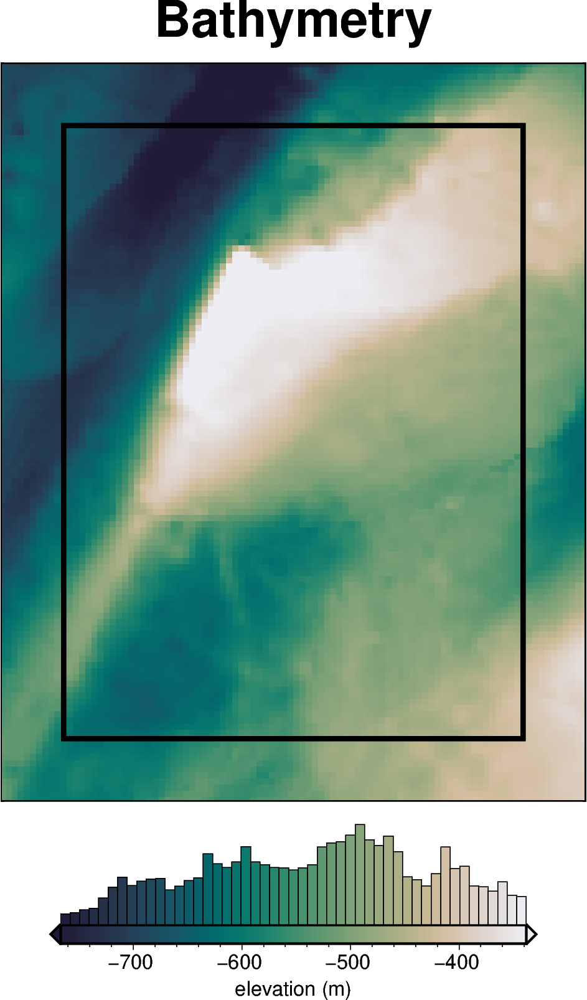

  0%|          | 0/7676 [00:00<?, ?it/s]

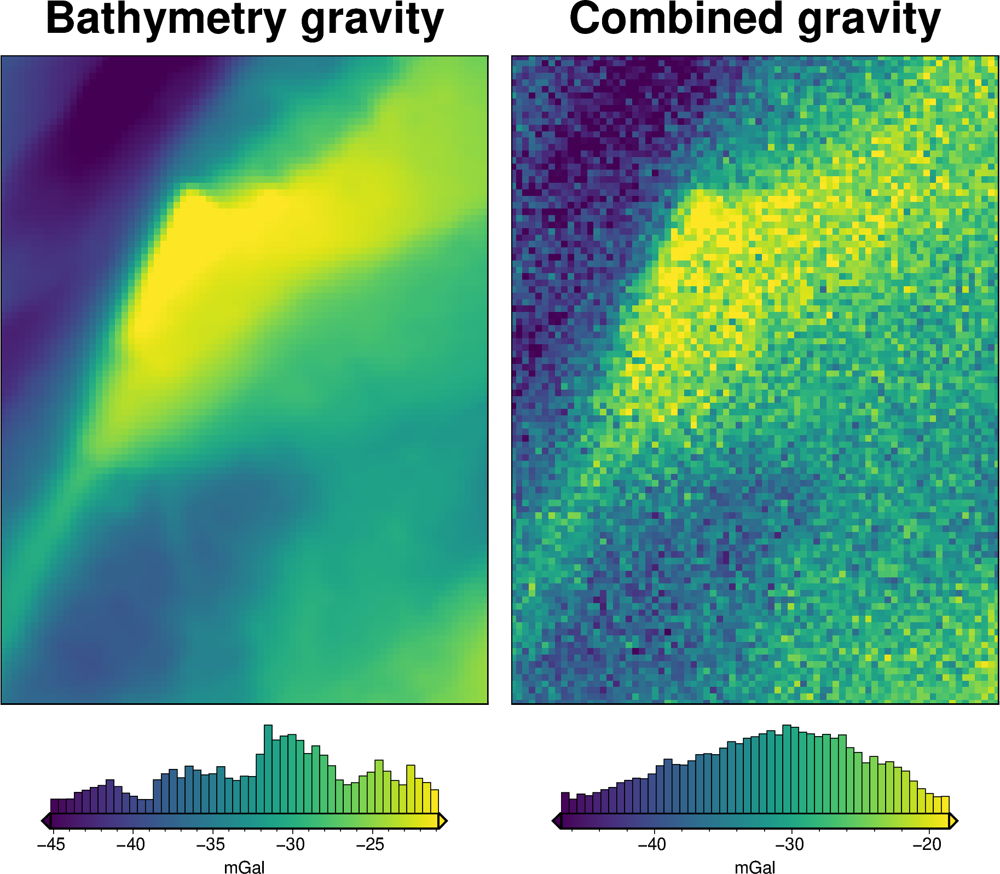

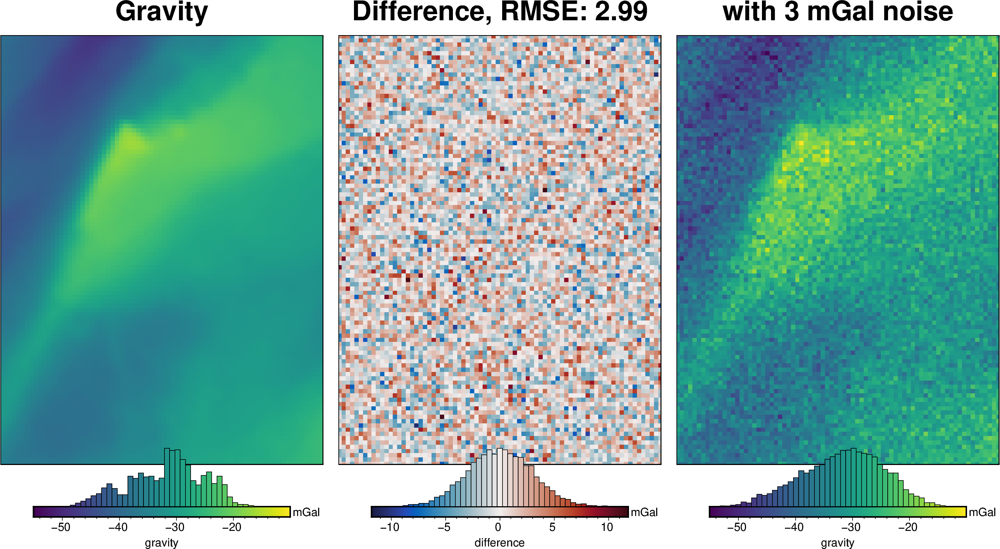

In [3]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = synthetic.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    gravity_noise=3,  # 3 mGal after filtering gives 1 mGal RMSE
    gravity_noise_wavelength=2e3,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

In [4]:
filter_widths = np.arange(0, 34e3, 2e3)
filter_widths

array([    0.,  2000.,  4000.,  6000.,  8000., 10000., 12000., 14000.,
       16000., 18000., 20000., 22000., 24000., 26000., 28000., 30000.,
       32000.])

In [5]:
dfs = []
for f in filter_widths:
    if f == 0:
        grav_df_filt = grav_df.copy()
    else:
        filtered_grav = utils.filter_grid(
            grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly,
            f,
            filt_type="lowpass",
            pad_mode="linear_ramp",
        )

        grav_df_filt = grav_df.copy()
        grav_df_filt["gravity_anomaly"] = filtered_grav.to_numpy().ravel()

    dfs.append(
        pd.DataFrame(
            [
                {
                    "filt_width": f,
                    "rmse": utils.rmse(
                        grav_df_filt.noise_free_disturbance
                        - grav_df_filt.gravity_anomaly,
                    ),
                }
            ]
        )
    )
df = pd.concat(dfs, ignore_index=True)
df

,filt_width,rmse
0,0.0,2.991005
1,2000.0,2.764011
2,4000.0,2.247810
3,6000.0,1.728592
4,8000.0,1.344717
5,10000.0,1.089794
6,12000.0,0.920326
7,14000.0,0.804231
8,16000.0,0.723484
9,18000.0,0.668162


In [6]:
# save to a csv
df.to_csv(f"{fpath}_filter_width_rmse.csv", index=False)

Text(0.5, 1.0, 'Low-pass filtering of gravity data')

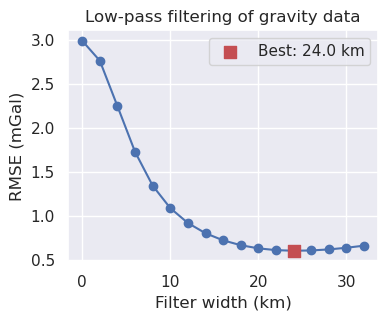

In [7]:
fig, ax = plt.subplots(figsize=(4, 3))
ax.plot(
    df.filt_width / 1e3,
    df.rmse,
    marker="o",
)

best_ind = df.rmse.idxmin()
ax.scatter(
    x=df.iloc[best_ind].filt_width / 1e3,
    y=df.iloc[best_ind].rmse,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(df.iloc[best_ind].filt_width / 1e3, 2)} km",
)
ax.legend()
ax.set_xlabel("Filter width (km)")
ax.set_ylabel("RMSE (mGal)")
ax.set_title("Low-pass filtering of gravity data")

In [8]:
filt_width = df.iloc[df.rmse.idxmin()].filt_width
print(f"Filter width: {filt_width / 1e3} km")

# filter each line in 1D with a Gaussian filter to remove some noise
filtered_grav = utils.filter_grid(
    grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly,
    filt_width,
    filt_type="lowpass",
    pad_mode="linear_ramp",
)

grav_df = grav_df.copy()
grav_df_filt["gravity_anomaly"] = filtered_grav.to_numpy().ravel()

grav_grid = grav_df_filt.set_index(["northing", "easting"]).to_xarray()

Filter width: 24.0 km


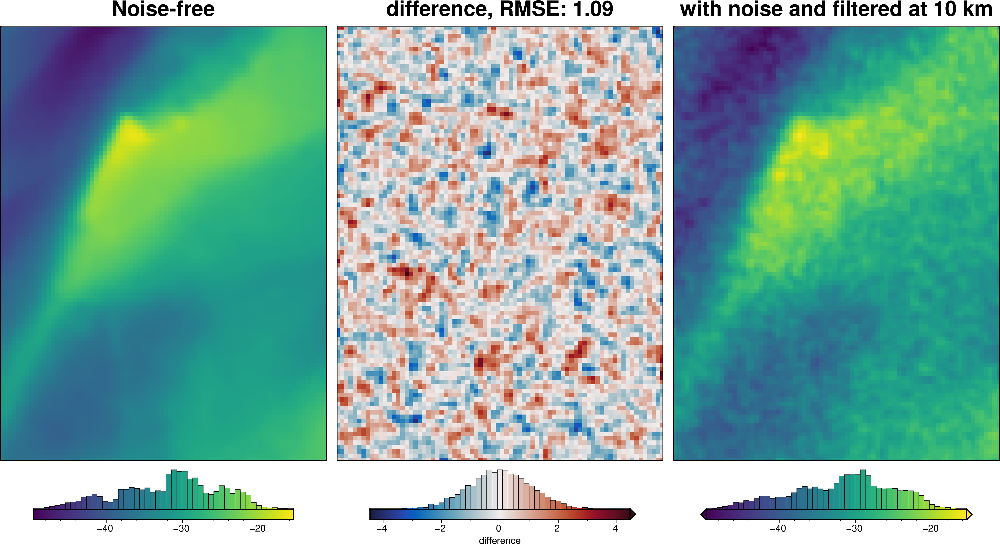

In [9]:
filtered_grav = utils.filter_grid(
    grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly,
    10e3,
    filt_type="lowpass",
    pad_mode="linear_ramp",
)

_ = polar_utils.grd_compare(
    grav_df.set_index(["northing", "easting"]).to_xarray().noise_free_disturbance,
    filtered_grav,
    grid1_name="Noise-free",
    grid2_name="with noise and filtered at 10 km",
    title="difference",
    plot=True,
    hist=True,
    inset=False,
)

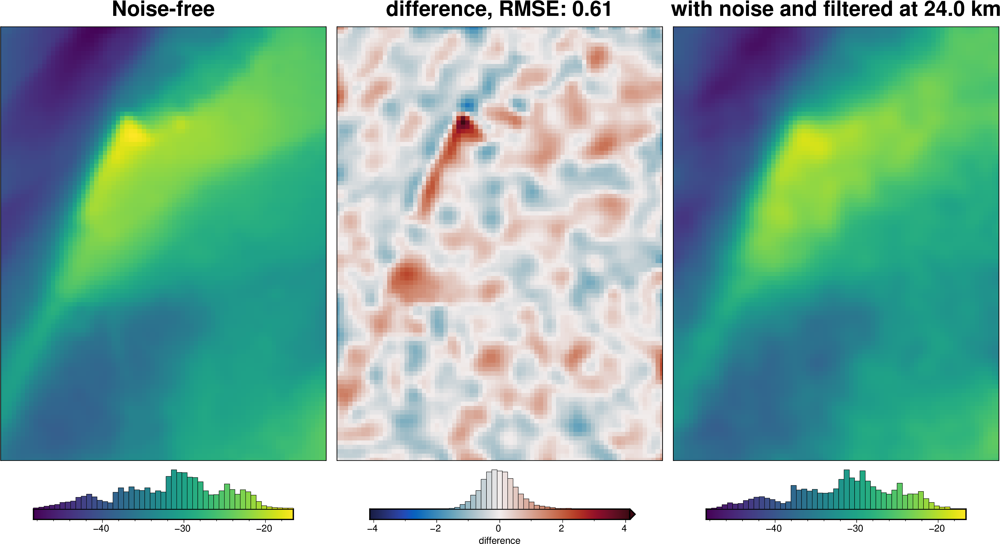

In [10]:
_ = polar_utils.grd_compare(
    grav_grid.noise_free_disturbance,
    grav_grid.gravity_anomaly,
    grid1_name="Noise-free",
    grid2_name=f"with noise and filtered at {round(filt_width / 1e3, 2)} km",
    title="difference",
    plot=True,
    hist=True,
    inset=False,
)

In [11]:
grav_df["gravity_anomaly"] = grav_df_filt.gravity_anomaly
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav,noise_free_disturbance,disturbance,uncert,gravity_anomaly
0,-1600000.0,-40000.0,1000.0,-35.551054,0,-35.551054,-36.610773,3,-35.473466
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-38.542478,3,-35.814409
2,-1600000.0,-36000.0,1000.0,-36.473146,0,-36.473146,-37.487424,3,-36.152914
3,-1600000.0,-34000.0,1000.0,-36.755608,0,-36.755608,-32.869103,3,-36.451007
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-39.690063,3,-36.671189
...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-26.837400,3,-25.264014
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-28.896369,3,-24.990153
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-21.663255,3,-24.927625
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-20.191439,3,-25.259400


## Make starting bathymetry model

In [12]:
# semi-regularly spaced
constraint_points = synthetic.constraint_layout_number(
    shape=(6, 7),
    region=inversion_region,
    padding=-spacing,
    shapefile="../results/Ross_Sea_outline.shp",
    add_outside_points=True,
    grid_spacing=spacing,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward
constraint_points.head()

,northing,easting,inside,true_upward,upward
0,-1600000.0,-40000.0,False,-601.093994,-601.093994
1,-1600000.0,-38000.0,False,-609.216919,-609.216919
2,-1600000.0,-36000.0,False,-616.355957,-616.355957
3,-1600000.0,-34000.0,False,-621.262268,-621.262268
4,-1600000.0,-32000.0,False,-625.510925,-625.510925


In [13]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)
starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 121, easting: 96)> Size: 93kB
array([[-541.24413869, -544.57181187, -547.92293689, ..., -360.00006254,
        -357.06767408, -354.19957766],
       [-543.34402688, -546.81675803, -550.35256333, ..., -362.90253226,
        -359.96874158, -357.11431886],
       [-545.05533622, -548.66036838, -552.37518163, ..., -365.66137905,
        -362.73269531, -359.90052824],
       ...,
       [-591.95335283, -595.518822  , -599.06869705, ..., -440.89315875,
        -440.6944619 , -440.40553782],
       [-590.53134833, -594.09076637, -597.64079288, ..., -440.69158328,
        -440.42525249, -440.07197234],
       [-589.16632671, -592.73504777, -596.30209679, ..., -440.51760947,
        -440.1713932 , -439.74434037]], shape=(121, 96))
Coordinates:
  * northing  (northing) float64 968B -1.62e+06 -1.618e+06 ... -1.38e+06
  * easting   (easting) float64 768B -6e+04 -5.8e+04 ... 1.28e+05 1.3e+05
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [14]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.starting_bathymetry)
print(f"RMSE: {rmse:.2f} m")

RMSE: 0.03 m


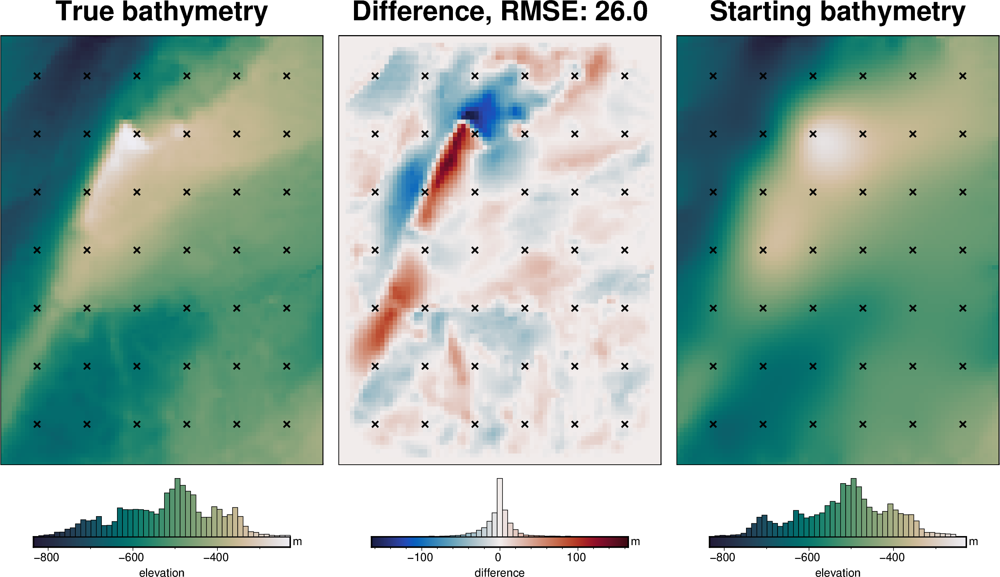

In [15]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    label_font="16p,Helvetica,black",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [16]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350

# set the reference level from the prisms to 0
zref = 0

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/7676 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav,noise_free_disturbance,disturbance,uncert,gravity_anomaly,starting_gravity
0,-1600000.0,-40000.0,1000.0,-35.551054,0,-35.551054,-36.610773,3,-35.473466,-32.541367
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-38.542478,3,-35.814409,-32.965831
2,-1600000.0,-36000.0,1000.0,-36.473146,0,-36.473146,-37.487424,3,-36.152914,-33.347648
3,-1600000.0,-34000.0,1000.0,-36.755608,0,-36.755608,-32.869103,3,-36.451007,-33.644496
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-39.690063,3,-36.671189,-33.840063
...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-26.837400,3,-25.264014,-23.321506
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-28.896369,3,-24.990153,-23.482116
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-21.663255,3,-24.927625,-23.605602
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-20.191439,3,-25.259400,-23.693171


In [17]:
regional_grav_kwargs = dict(
    method="constant",
    constraints_df=constraint_points,
)
grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

grav_df

,northing,easting,upward,bathymetry_grav,basement_grav,noise_free_disturbance,disturbance,uncert,gravity_anomaly,starting_gravity,misfit,reg,res
0,-1600000.0,-40000.0,1000.0,-35.551054,0,-35.551054,-36.610773,3,-35.473466,-32.541367,-2.932099,-2.679373,-0.252726
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-38.542478,3,-35.814409,-32.965831,-2.848578,-2.679373,-0.169205
2,-1600000.0,-36000.0,1000.0,-36.473146,0,-36.473146,-37.487424,3,-36.152914,-33.347648,-2.805266,-2.679373,-0.125893
3,-1600000.0,-34000.0,1000.0,-36.755608,0,-36.755608,-32.869103,3,-36.451007,-33.644496,-2.806512,-2.679373,-0.127139
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-39.690063,3,-36.671189,-33.840063,-2.831126,-2.679373,-0.151753
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-26.837400,3,-25.264014,-23.321506,-1.942508,-2.679373,0.736865
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-28.896369,3,-24.990153,-23.482116,-1.508037,-2.679373,1.171336
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-21.663255,3,-24.927625,-23.605602,-1.322022,-2.679373,1.357351
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-20.191439,3,-25.259400,-23.693171,-1.566230,-2.679373,1.113143


makecpt [ERROR]: Option T: min >= max
supplied min value is greater or equal to max value
Grid/points are a constant value, can't make a colorbar histogram!


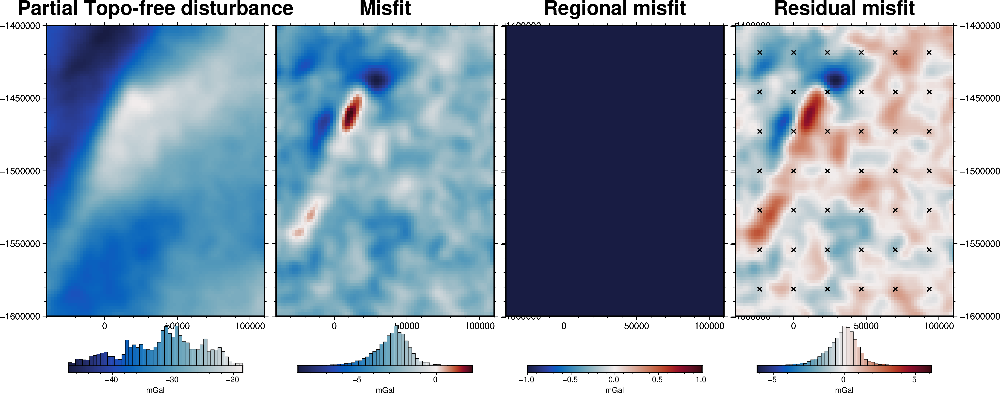

In [18]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

In [19]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": grav_df.uncert.mean()
    ** 0.5,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
}

## Damping Cross Validation

In [20]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    fname=f"{fpath}_damping_cv",
    **kwargs,
)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

In [20]:
# load saved inversion results
with pathlib.Path(f"{fpath}_damping_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [21]:
best_damping = parameters.get("Solver damping")
kwargs["solver_damping"] = best_damping
best_damping

0.01406058612011891

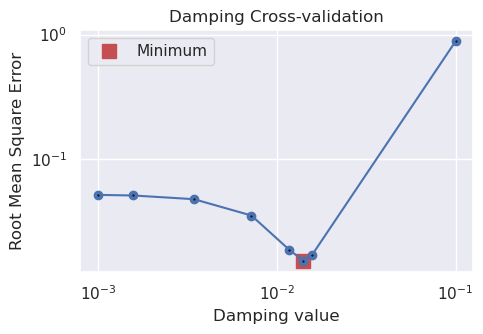

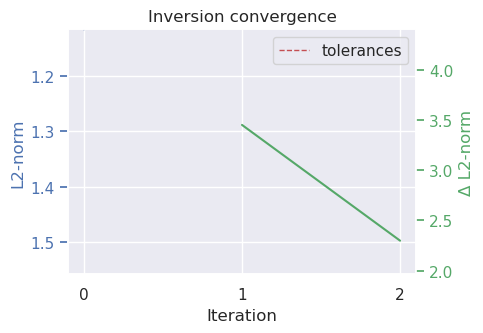

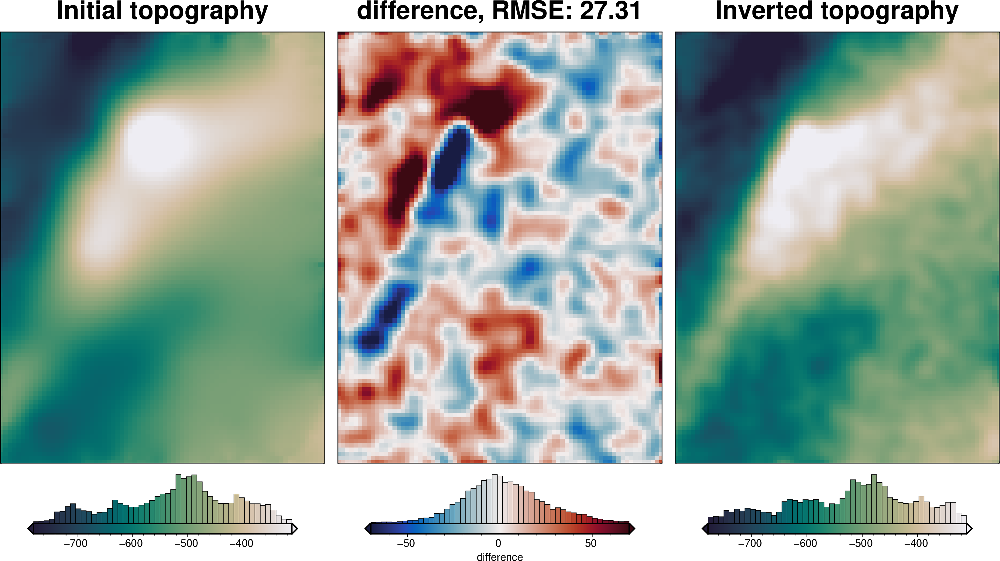

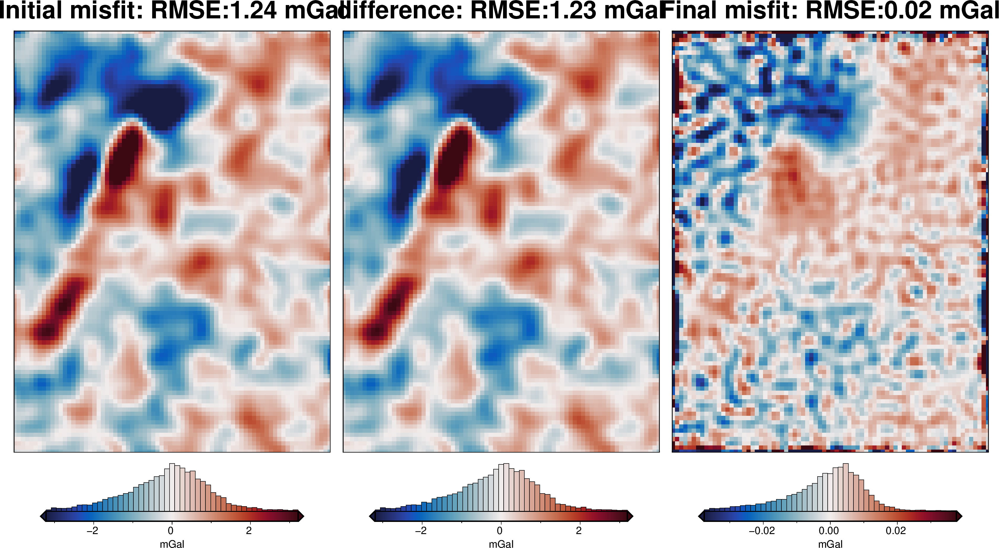

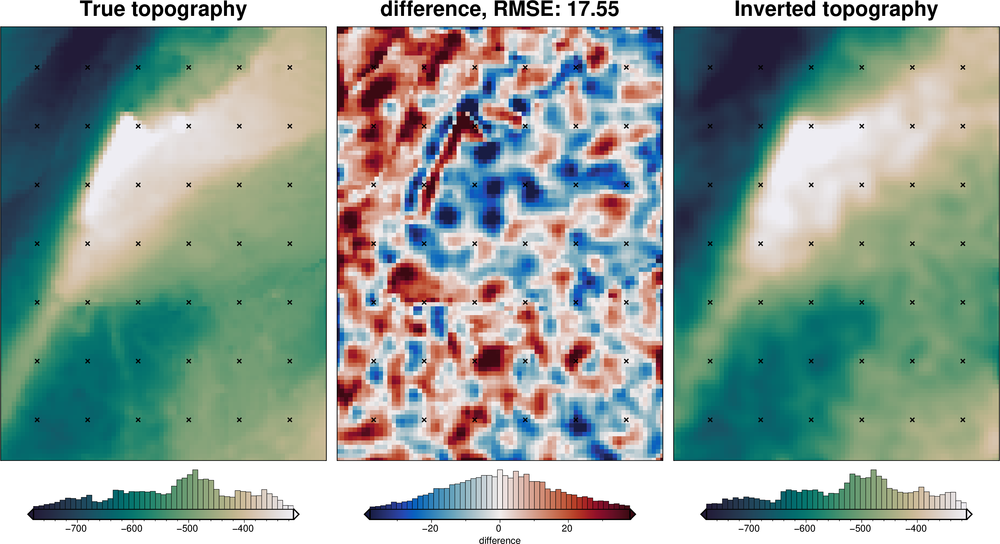

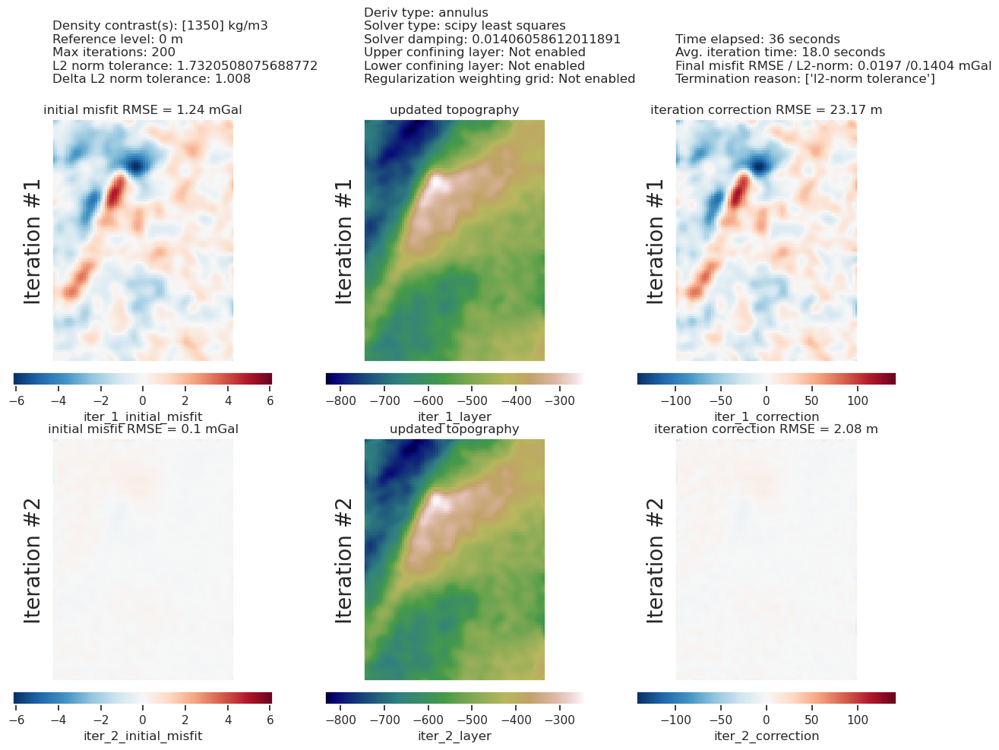

In [22]:
study_df = study.trials_dataframe()

plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)

plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [23]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 22.58 m


## Density CV

In [25]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_topography=starting_bathymetry,
    zref=0,
    calculate_regional_misfit=True,
    regional_grav_kwargs=dict(
        grav_df=grav_df,
        method="constant",
        constant=0,
    ),
    run_zref_or_density_cv=True,
    constraints_df=constraint_points,
    density_contrast_limits=(1000, 2400),
    zref_density_cv_trials=10,
    fname=f"{fpath}_density_cv",
    **kwargs,
)

'reg' already a column of `grav_df`, but is being overwritten since calculate_regional_misfit is True


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

'starting_gravity' already a column of `grav_df`, but is being overwritten since calculate_starting_gravity is True
'reg' already a column of `grav_df`, but is being overwritten since calculate_regional_misfit is True


In [24]:
# load saved inversion results
with pathlib.Path(f"{fpath}_density_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results


# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

In [25]:
best_density_contrast = study.best_params["density_contrast"]
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)

optimal determined density contrast 1471
real density contrast 1476


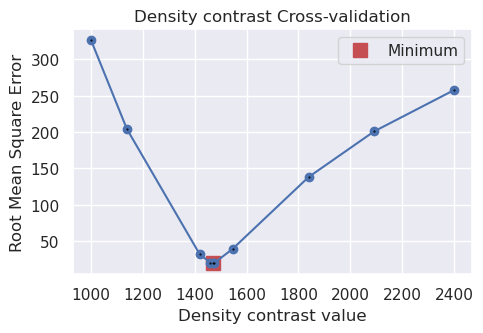

In [26]:
study_df = study.trials_dataframe()

fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_density_contrast,
    param_name="Density contrast",
)

### Redo with optimal density contrast
During the density cross-validation to avoid biasing the scores, we had to manually set a regional field. Now, with the optimal density contrast value found, we can rerun the inversion with an automatically determined regional field strength (the average value misfit at the constraints).

In [27]:
density_contrast = best_density_contrast

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

  0%|          | 0/7676 [00:00<?, ?it/s]

makecpt [ERROR]: Option T: min >= max
supplied min value is greater or equal to max value
Grid/points are a constant value, can't make a colorbar histogram!


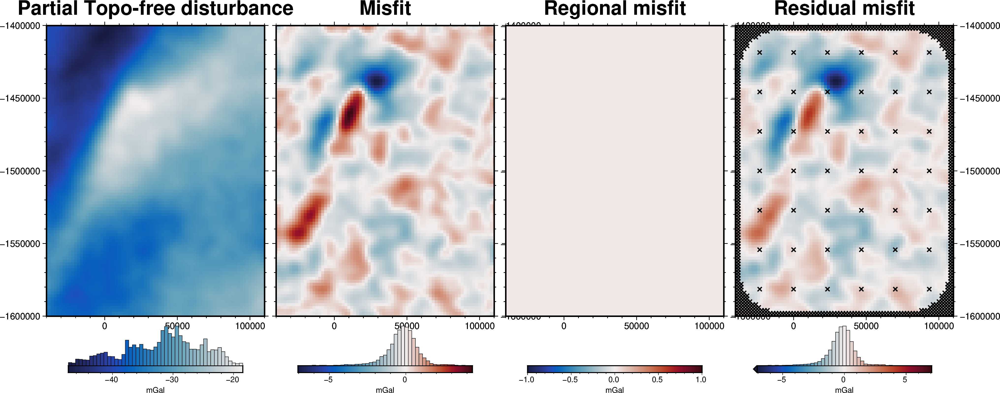

In [28]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points,
    points_style="x.2c",
)
fig.show()

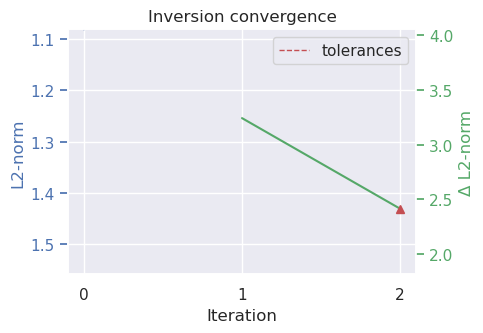

In [29]:
# run the inversion workflow
inversion_results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    fname=f"{fpath}_optimal",
    starting_prisms=starting_prisms,
    plot_dynamic_convergence=True,
    **kwargs,
)

In [30]:
# load saved inversion results
with pathlib.Path(f"{fpath}_optimal_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

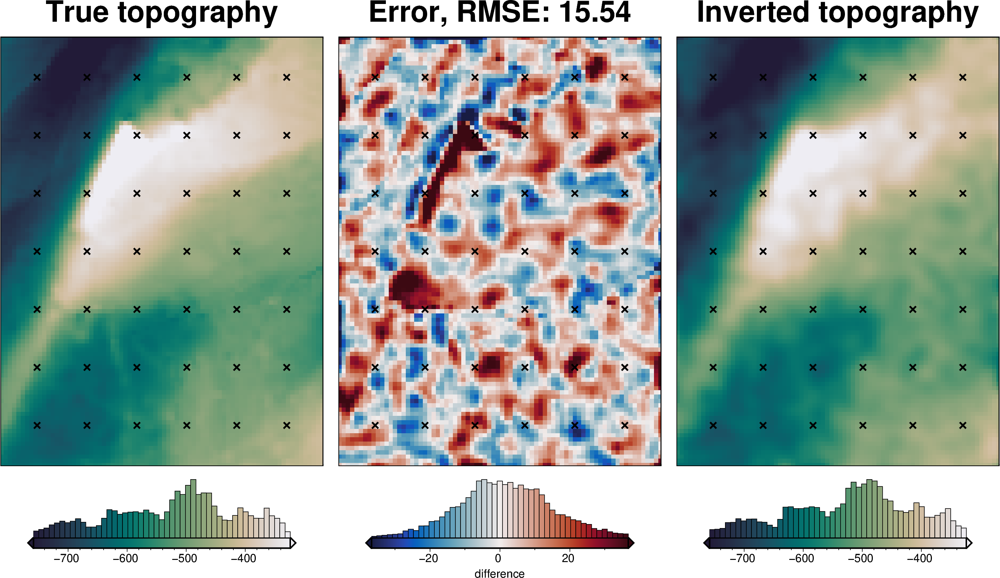

In [31]:
_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    fig_height=10,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="Error",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

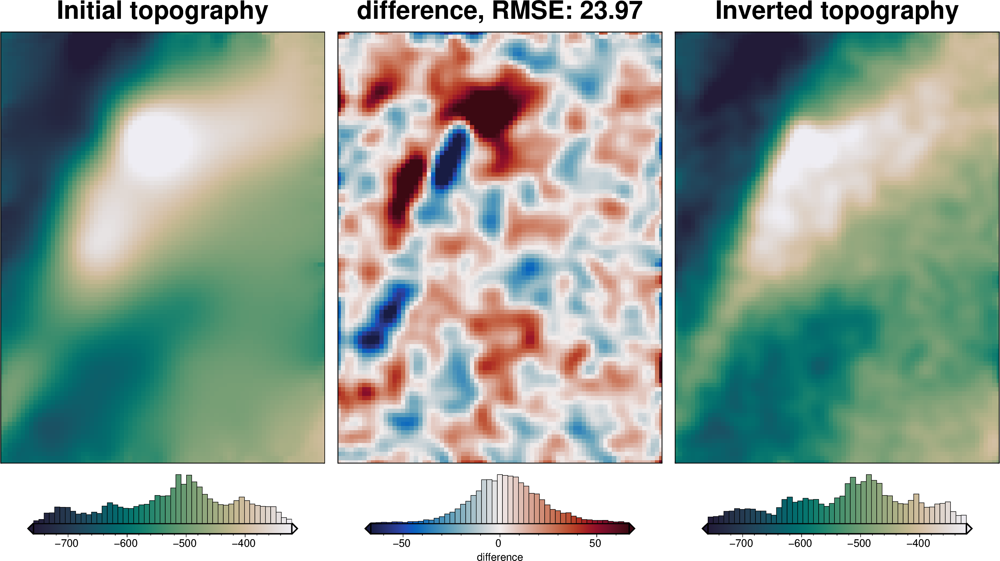

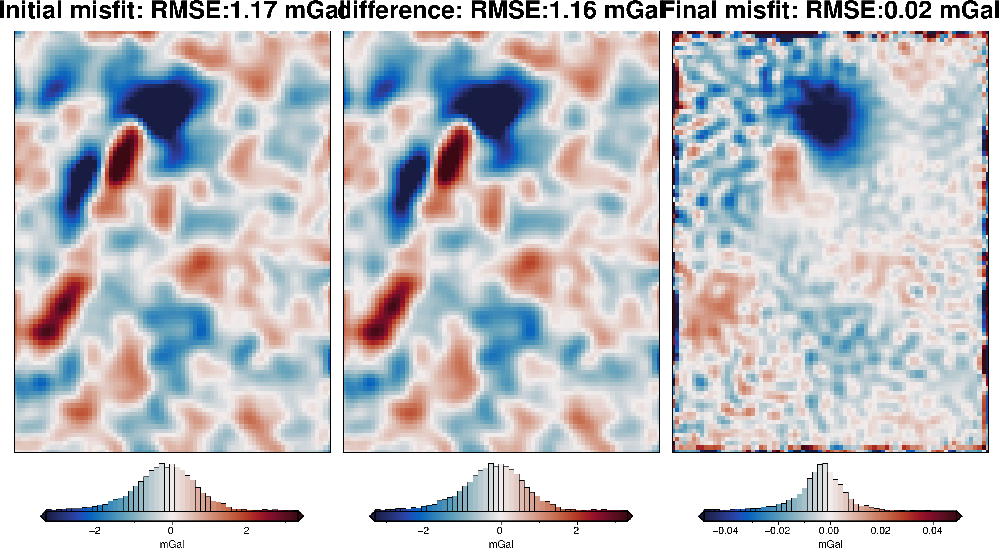

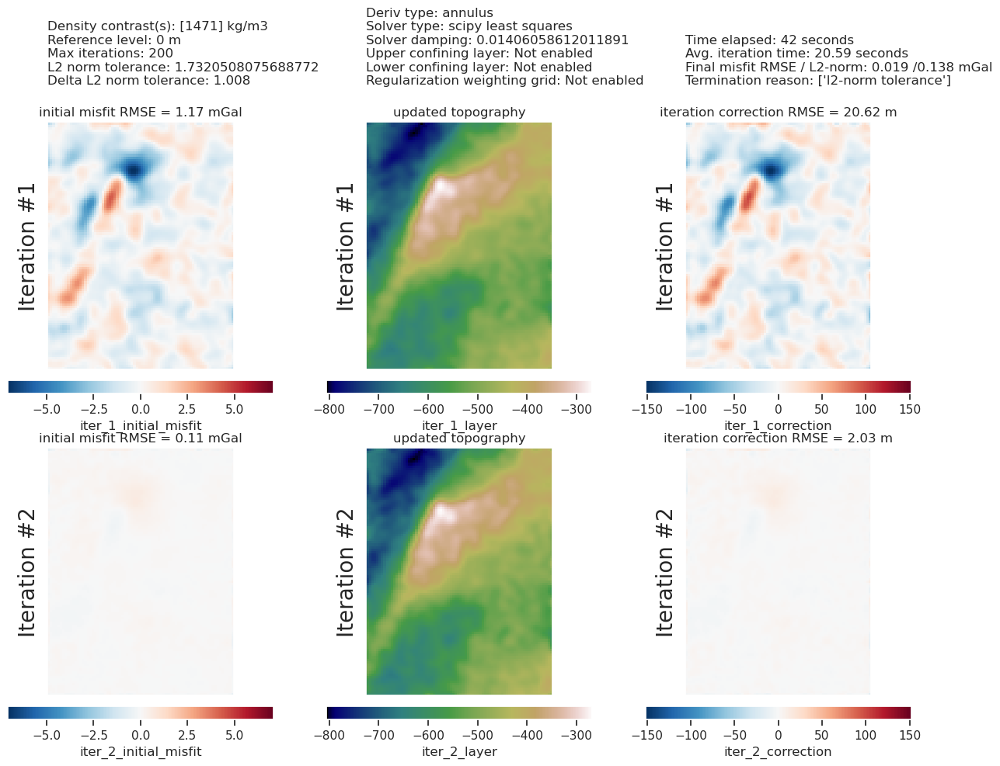

In [32]:
plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

In [33]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 19.53 m


In [34]:
# save to csv
constraint_points.to_csv(f"{fpath}_constraint_points.csv", index=False)

In [35]:
constraint_points = pd.read_csv(f"{fpath}_constraint_points.csv")
constraint_points

,northing,easting,inside,true_upward,upward,starting_bathymetry,inverted_topography
0,-1.600000e+06,-4.000000e+04,False,-601.093994,-601.093994,-601.093994,-606.327698
1,-1.600000e+06,-3.800000e+04,False,-609.216919,-609.216919,-609.216919,-610.490051
2,-1.600000e+06,-3.600000e+04,False,-616.355957,-616.355957,-616.355957,-613.916565
3,-1.600000e+06,-3.400000e+04,False,-621.262268,-621.262268,-621.262268,-617.907288
4,-1.600000e+06,-3.200000e+04,False,-625.510925,-625.510925,-625.510925,-622.178467
...,...,...,...,...,...,...,...
881,-1.418571e+06,-3.637979e-12,True,-747.305711,-747.305711,-747.289192,-758.786011
882,-1.418571e+06,2.333333e+04,True,-619.672055,-619.672055,-619.459742,-623.038431
883,-1.418571e+06,4.666667e+04,True,-505.761536,-505.761536,-505.739808,-519.610493
884,-1.418571e+06,7.000000e+04,True,-447.753091,-447.753091,-447.782831,-429.904140


## Uncertainty analysis

### Inversion error

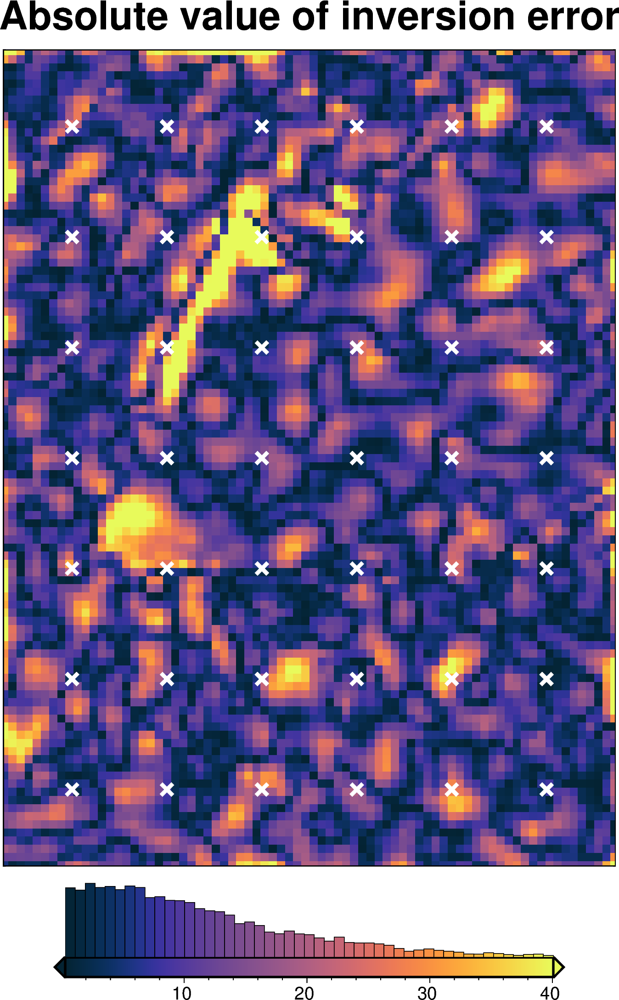

In [36]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    region=inversion_region,
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points[constraint_points.inside],
    points_style="x.3c",
    points_fill="white",
    points_pen="2p",
)
fig.show()

In [37]:
# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=regional_grav_kwargs,
    **kwargs,
)

### Solver damping component

In [38]:
# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
stdev = stdev / 2
print(f"using stdev: {stdev}")

calculated stdev: 0.4792126581484365
using stdev: 0.23960632907421825


best: 0.01406058612011891 
std: 0.23960632907421825 
+1std: 0.024412359332848386 
-1std: 0.008098360316008565


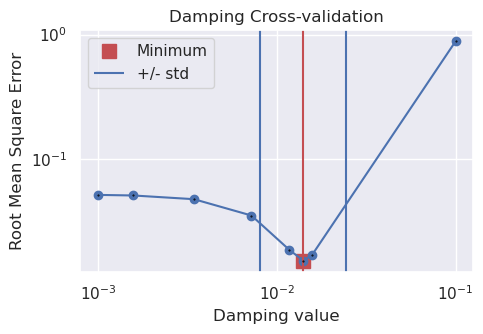

In [39]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

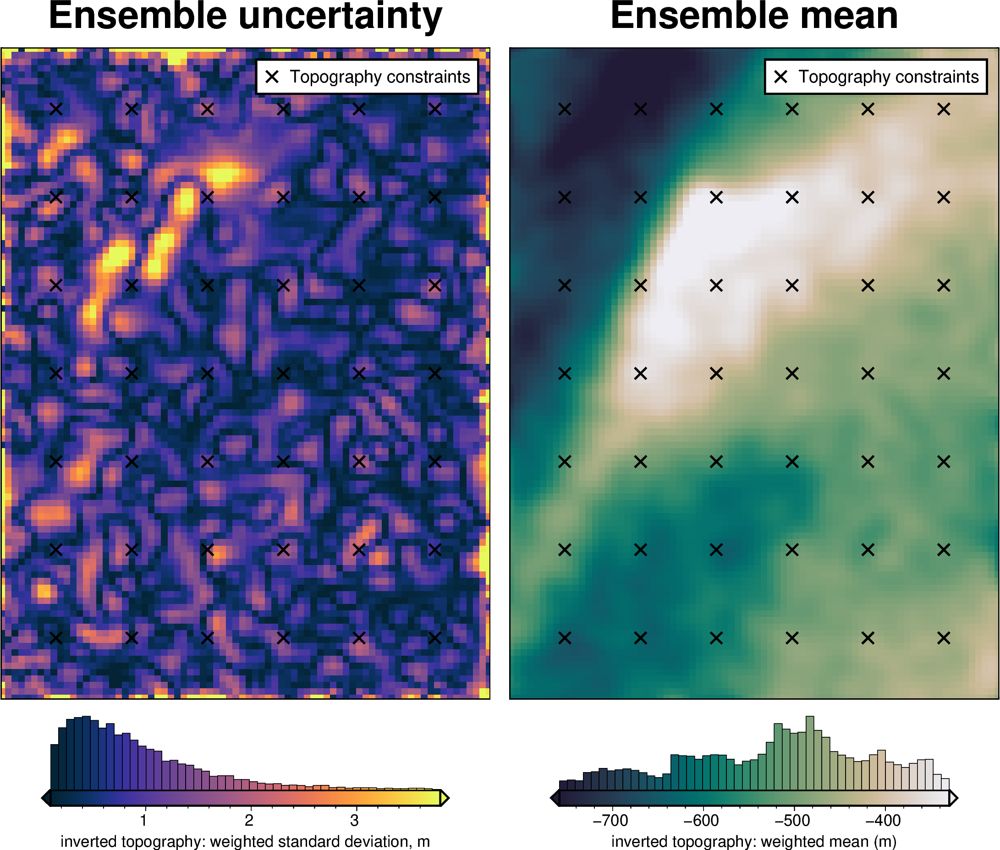

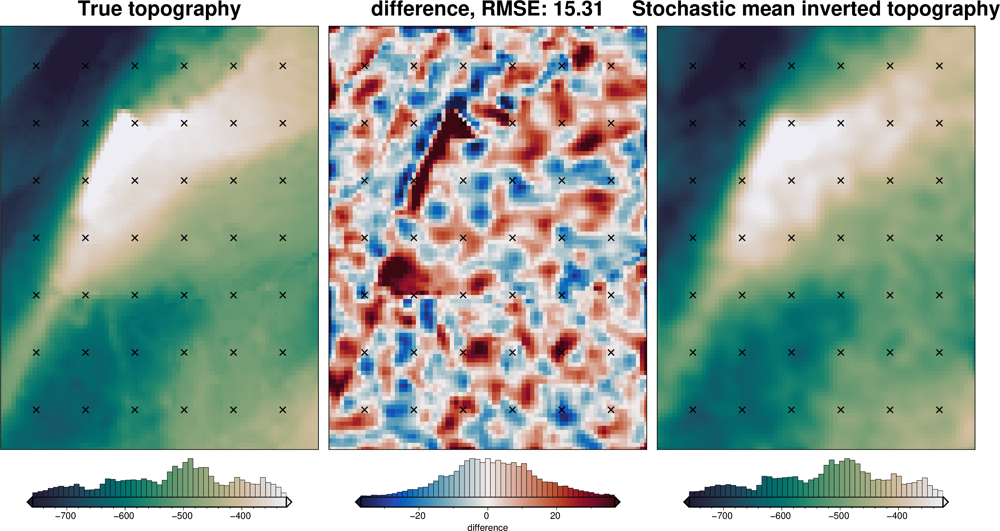

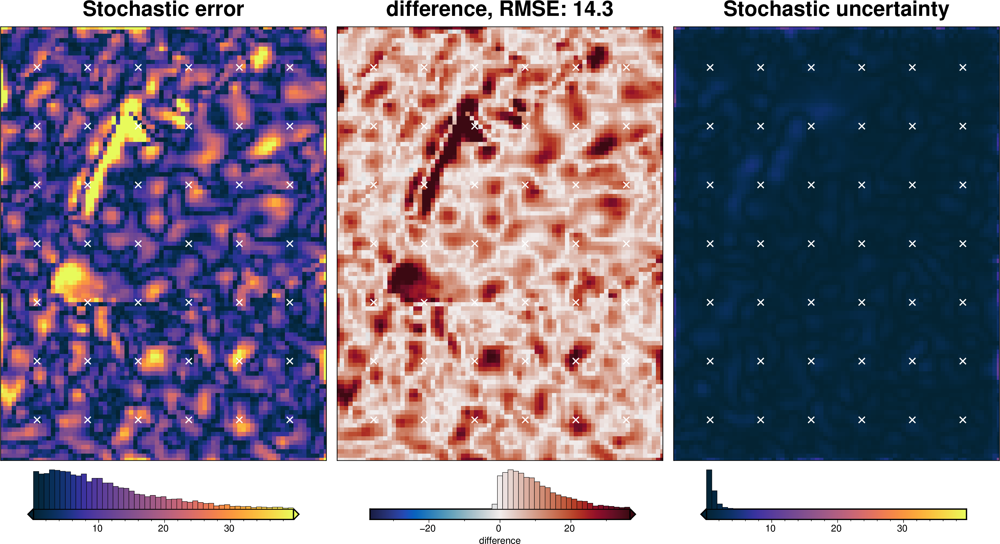

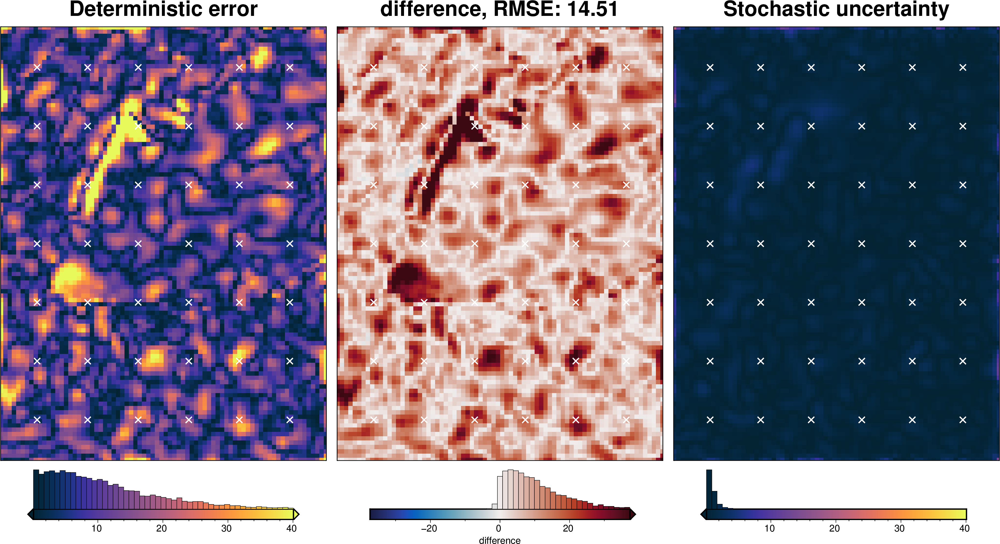

In [40]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(best_damping),  # mean of base 10 exponent
        "scale": stdev,  # standard deviation of base 10 exponent
        "log": True,
    },
}
fname = f"{fpath}_uncertainty_damping"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_damping_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
)

### Density component

In [41]:
# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
stdev = 5
print(f"using stdev: {stdev}")

print(
    f"density estimation error: {np.abs(true_density_contrast - best_density_contrast)}"
)

calculated stdev: 421.3222572383809
using stdev: 5
density estimation error: 5


best: 1471 
std: 5 
+1std: 1476 
-1std: 1466


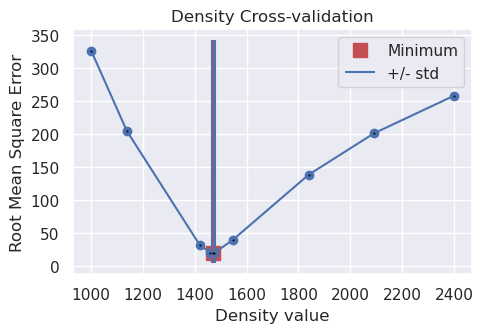

In [42]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.to_numpy(),
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

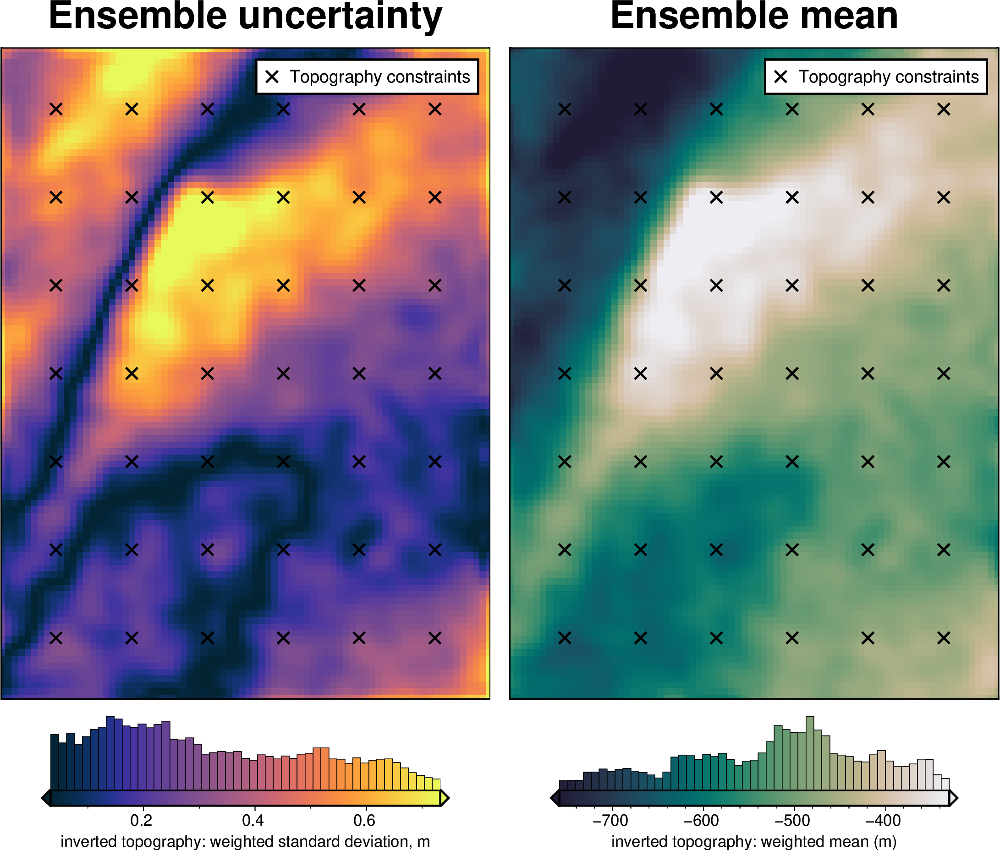

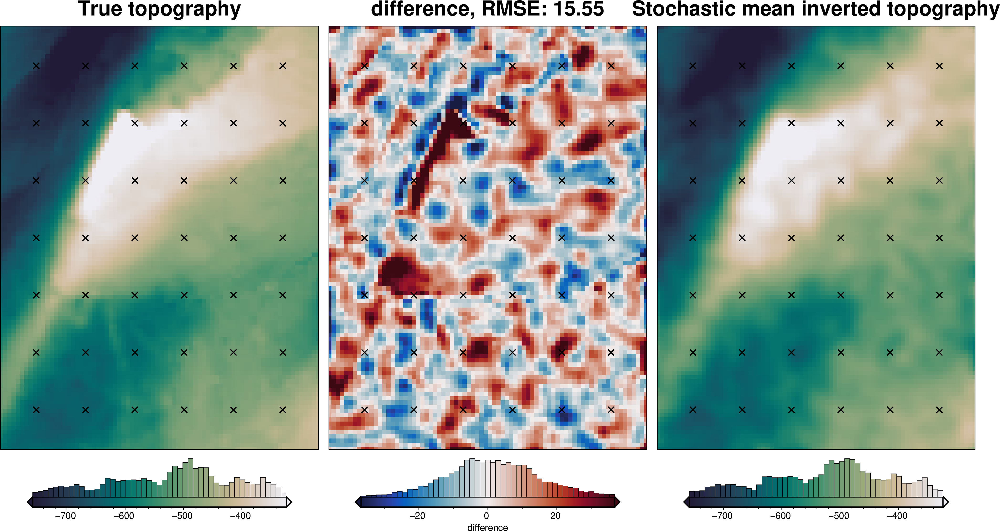

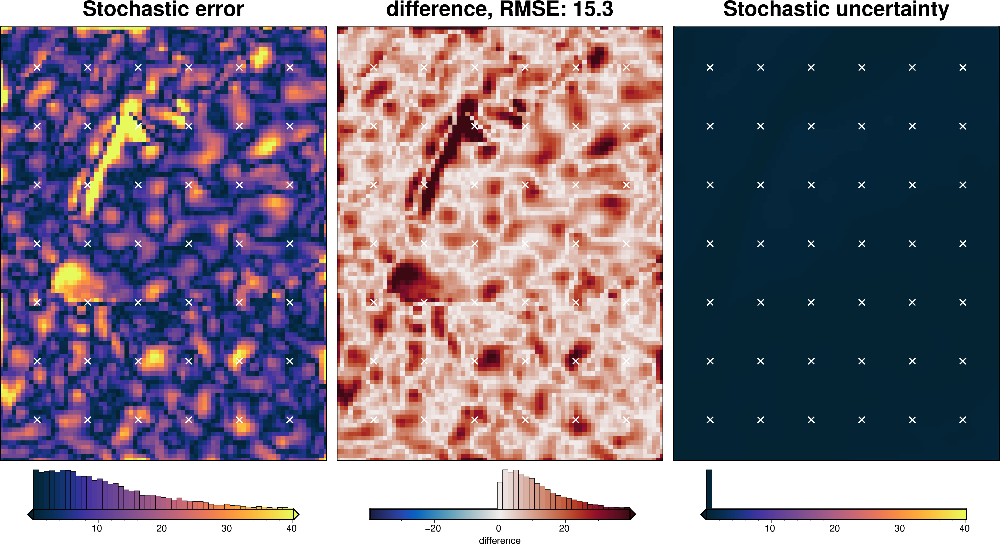

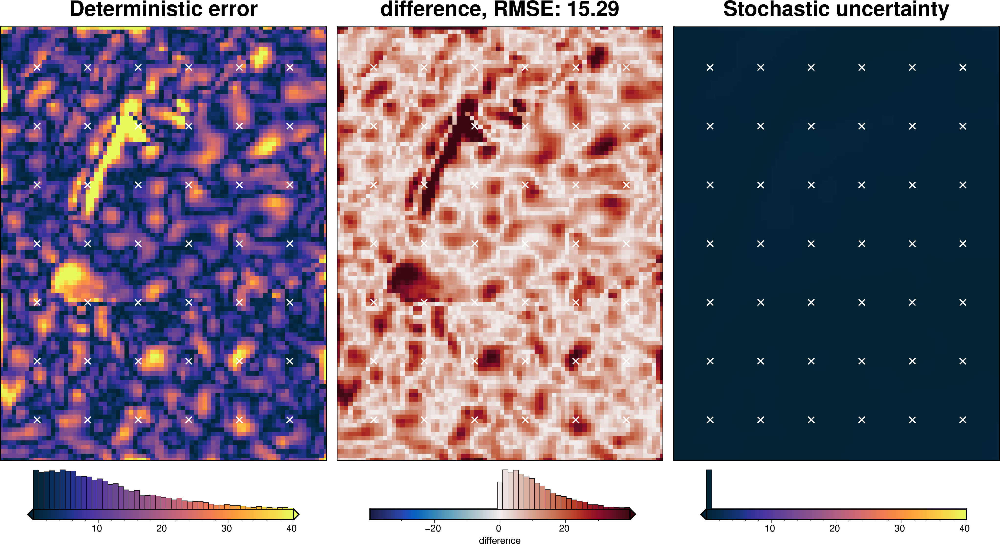

In [43]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = f"{fpath}_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_density_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
)

### Gravity component

stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

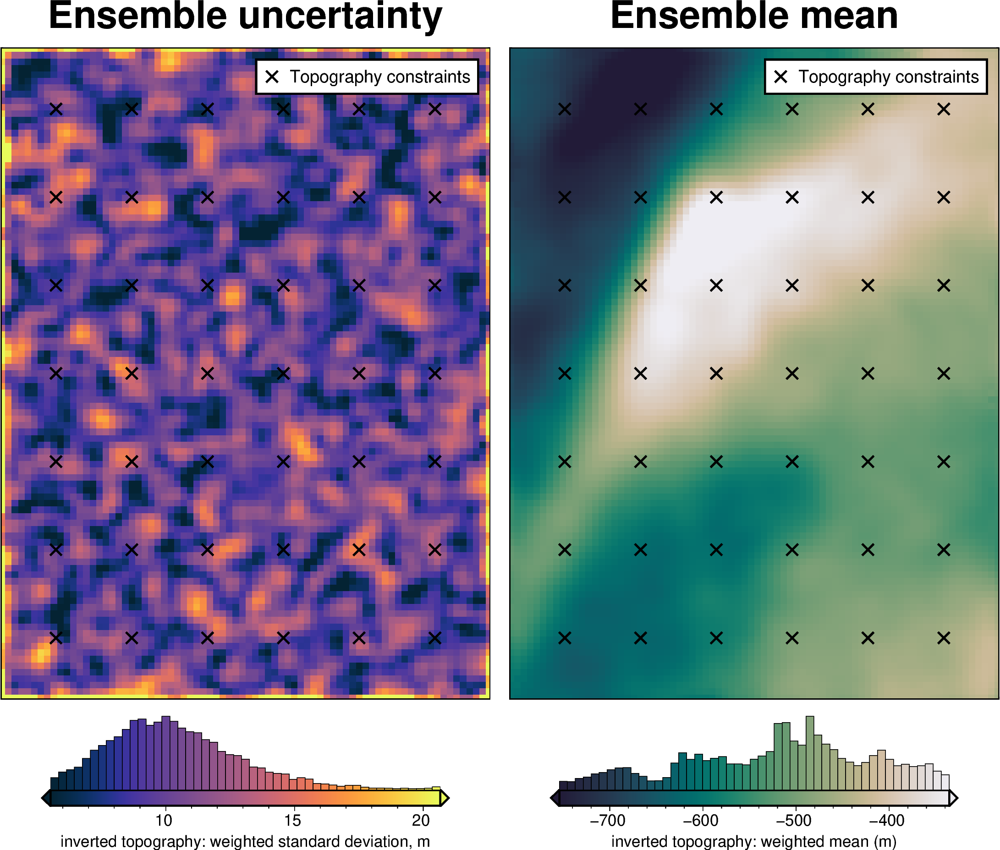

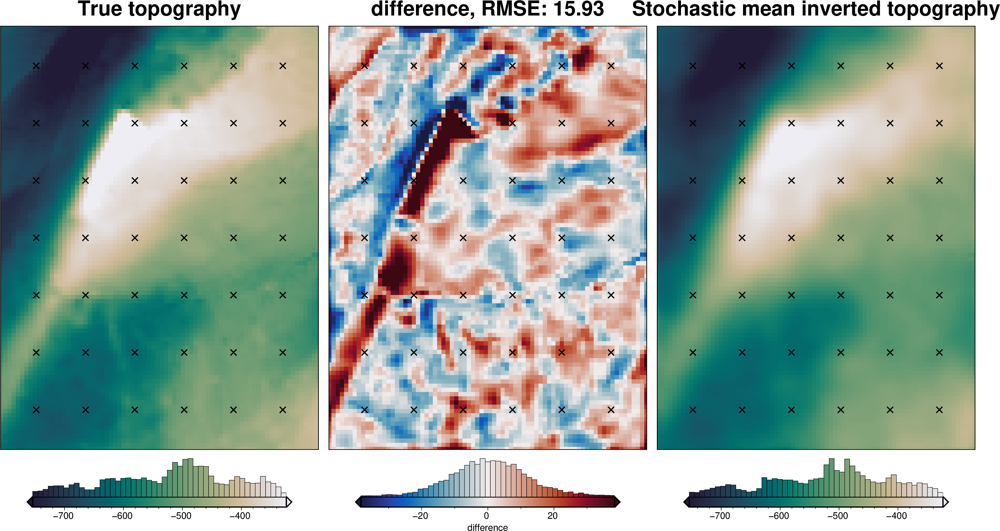

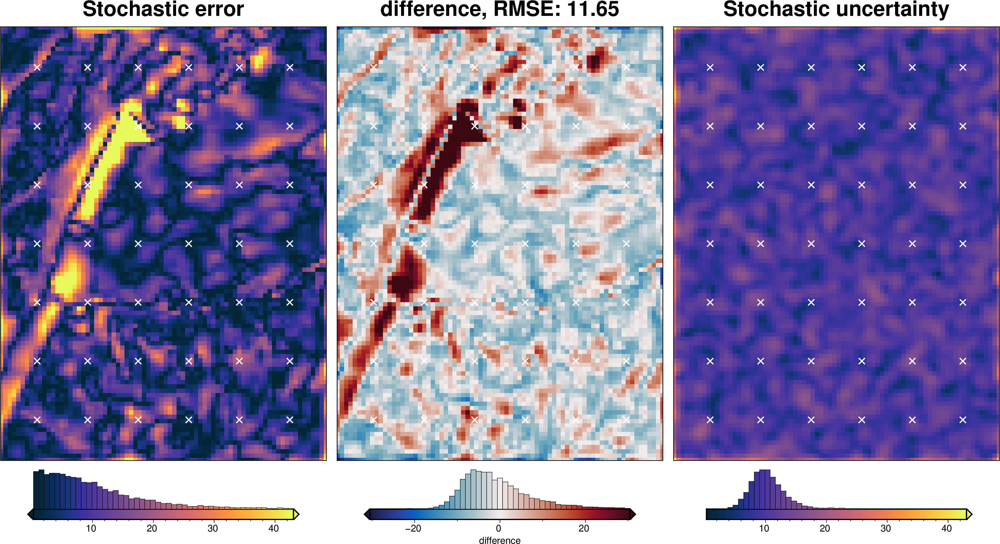

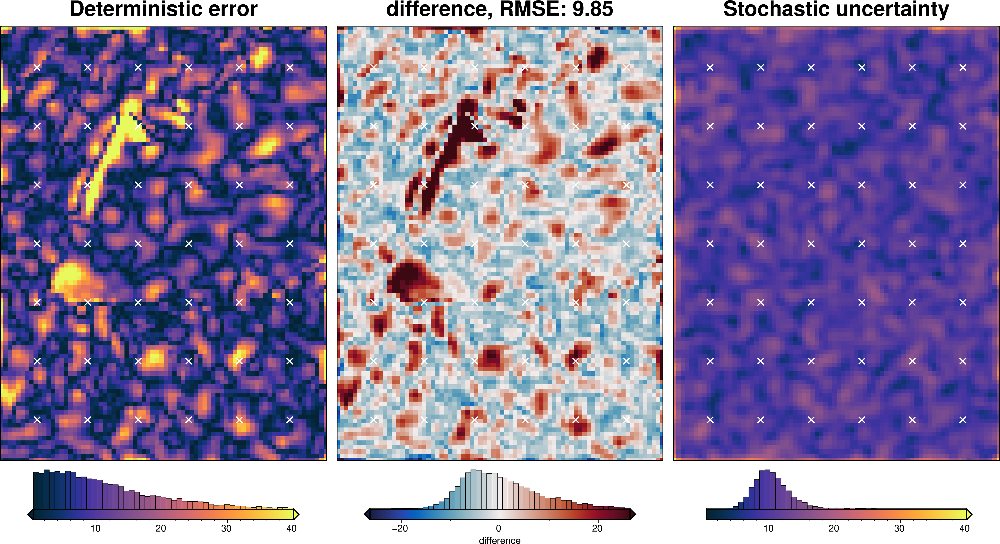

In [44]:
fname = f"{fpath}_uncertainty_grav_filter"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_grav_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    sample_gravity=True,
    gravity_filter_width=filt_width,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_grav_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
)

### Total uncertainty

stochastic ensemble:   0%|          | 0/20 [00:00<?, ?it/s]

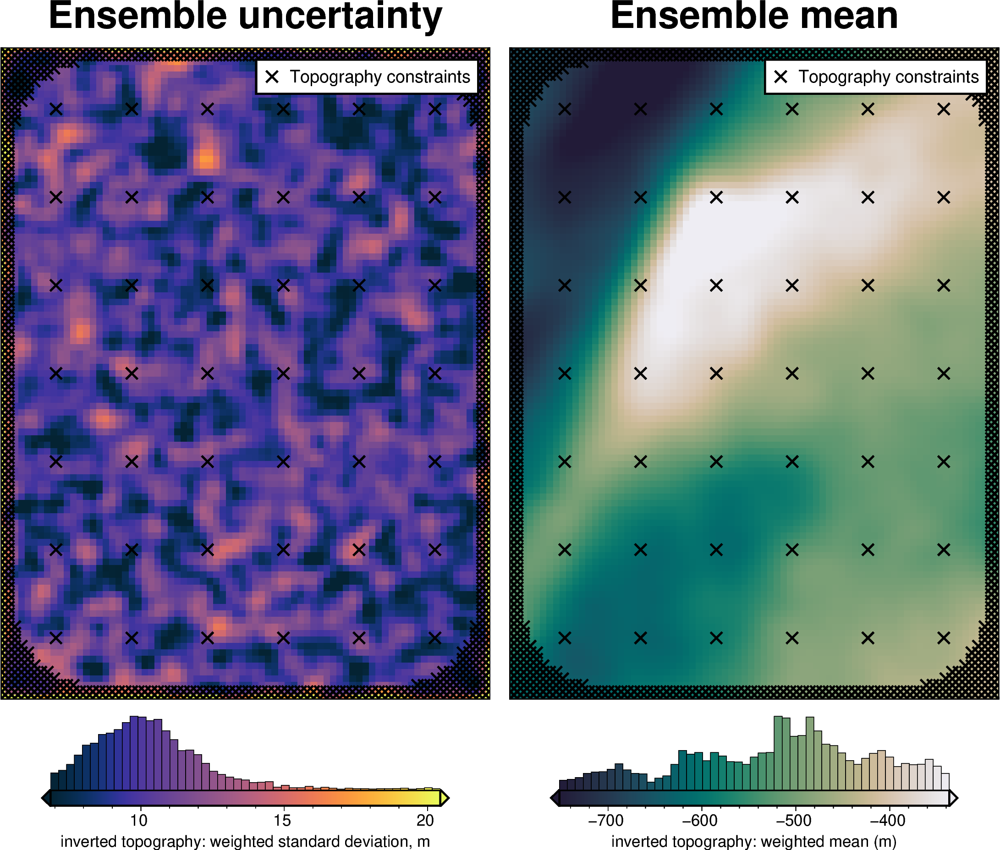

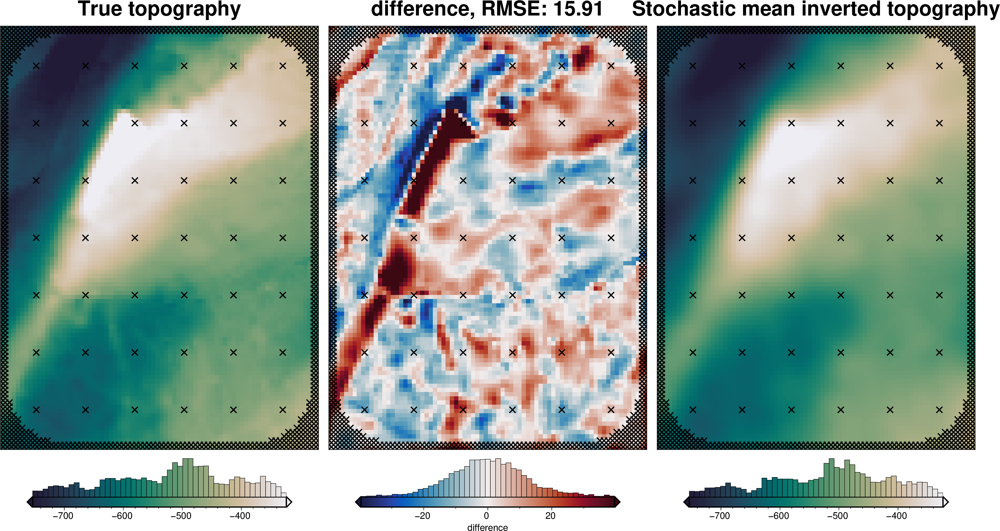

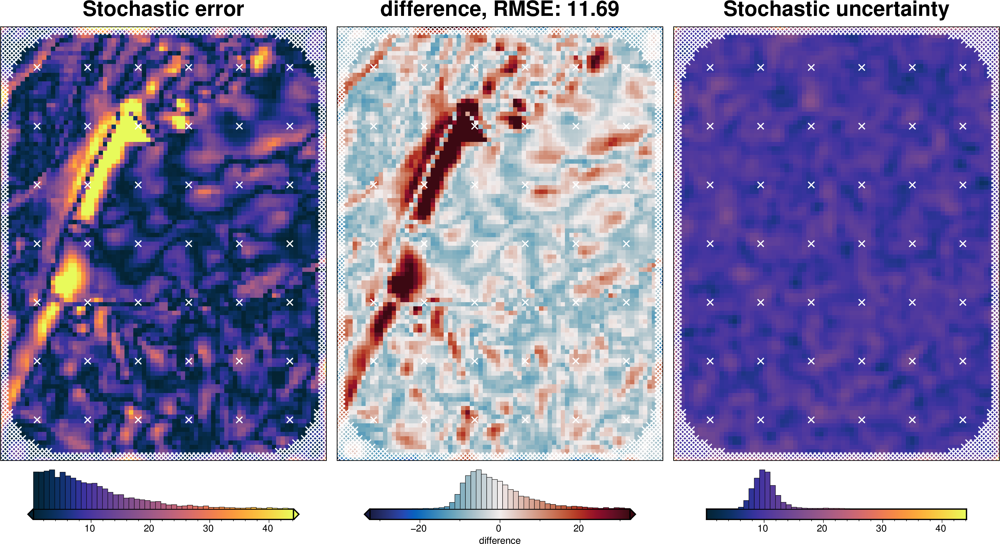

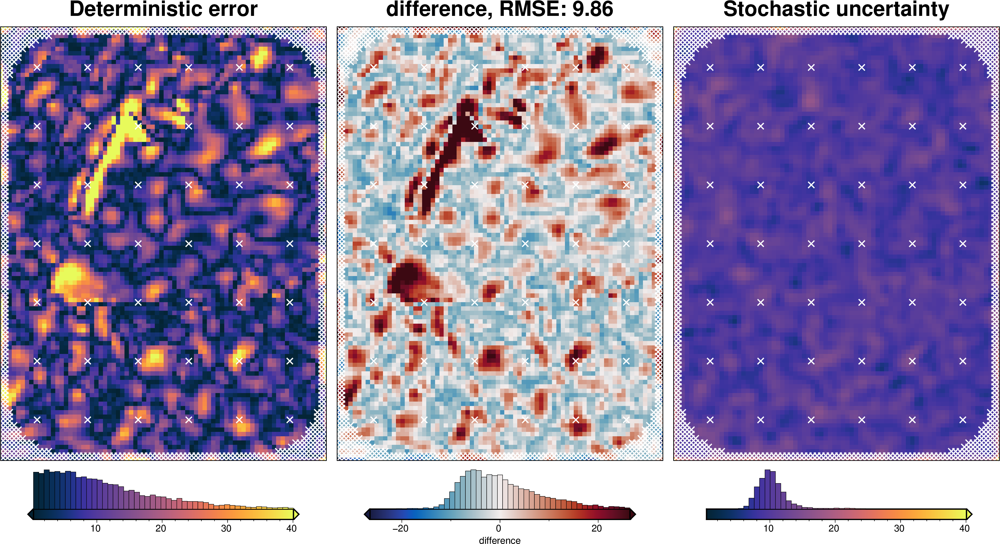

In [45]:
fname = f"{fpath}_uncertainty_full"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    sample_gravity=True,
    gravity_filter_width=filt_width,
    parameter_dict=solver_dict | density_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points,
    weight_by="constraints",
)

### Comparing results

In [46]:
results = [
    uncert_results,
    uncert_grav_results,
    uncert_density_results,
    uncert_damping_results,
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        region=inversion_region,
    )
    stats.append(ds)

In [47]:
names = [
    "full",
    "gravity",
    "density",
    "damping",
]

# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 247kB
Dimensions:        (northing: 101, easting: 76)
Coordinates:
  * northing       (northing) float64 808B -1.6e+06 -1.598e+06 ... -1.4e+06
  * easting        (easting) float64 608B -4e+04 -3.8e+04 ... 1.08e+05 1.1e+05
Data variables:
    full_stdev     (northing, easting) float64 61kB 33.4 24.75 ... 16.78 26.5
    gravity_stdev  (northing, easting) float64 61kB 40.12 27.22 ... 13.68 20.22
    density_stdev  (northing, easting) float64 61kB 0.119 0.1515 ... 0.7546
    damping_stdev  (northing, easting) float64 61kB 3.629 1.588 ... 1.697 8.544

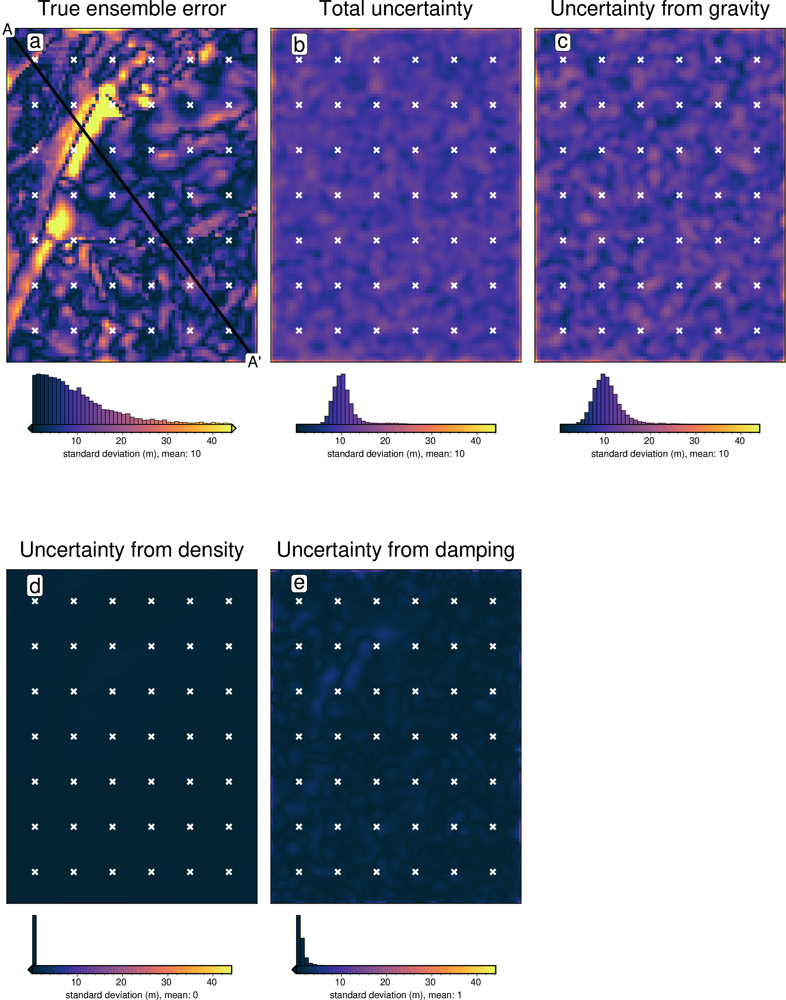

In [48]:
titles = [
    "True ensemble error",
    "Total uncertainty",
    "Uncertainty from gravity",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 3:
        origin_shift = "both_shift"
        xshift_amount = -2
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).


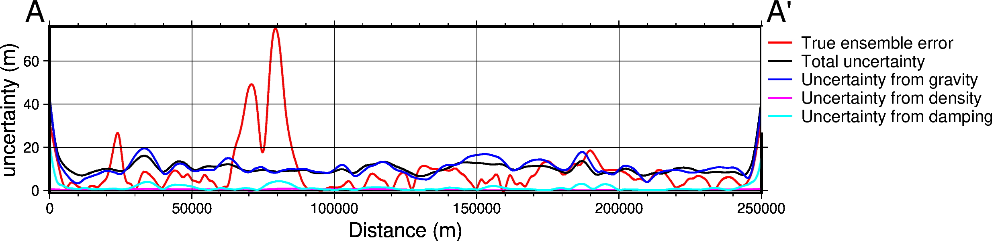

In [49]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

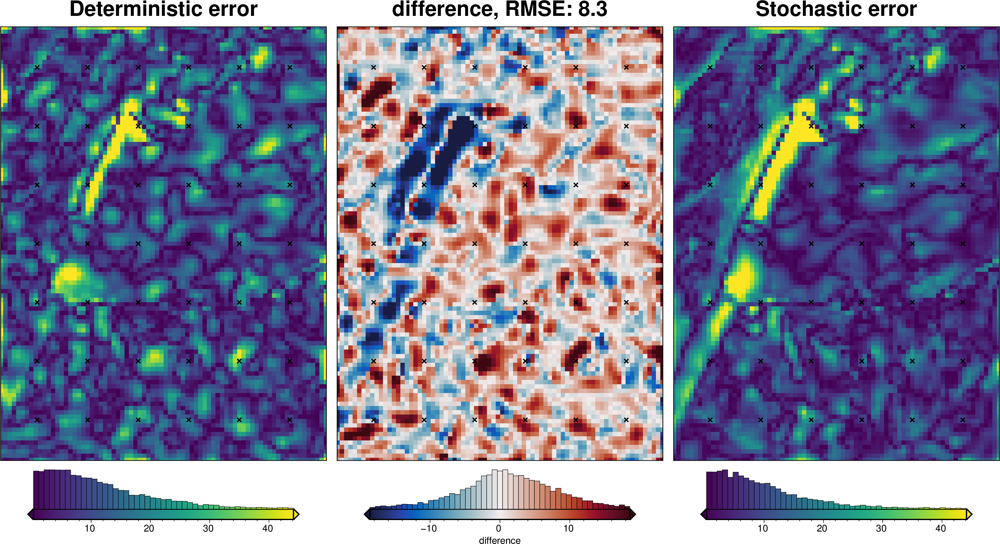

In [50]:
_ = polar_utils.grd_compare(
    inversion_error,
    np.abs(stats[0].weighted_mean - bathymetry),
    region=inversion_region,
    plot=True,
    grid1_name="Deterministic error",
    grid2_name="Stochastic error",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [51]:
# save results
merged.to_netcdf(f"{fpath}_sensitivity.nc")

In [52]:
stats_ds.to_netcdf(f"{fpath}_uncertainty.nc")